# 🚦 Real-Time Traffic Density Estimation — Research-Level Enhanced Version
### Model: YOLOv8 (Primary) + Faster R-CNN (Secondary) | Ensemble Learning
### Dataset: UAVDT + FLIR Merged | 6 Classes: bicycle, car, bus, truck, van, person
---
## 🔬 Research Improvements (Inspired from Paper: *Mittal & Chawla, 2023*)
| # | Improvement | Status |
|---|---|---|
| 1 | **Ensemble Model** (YOLOv8 + Faster R-CNN) | ✅ Implemented |
| 2 | **Smart Duplicate Removal** (IoU-based NMS) | ✅ Implemented |
| 3 | **Weighted Traffic Density Formula** (paper Table 2 weights) | ✅ Implemented |
| 4 | **Image Preprocessing** (CLAHE + Gamma for low light) | ✅ Implemented |
| 5 | **Adaptive Signal Control Simulation** | ✅ Implemented |
| 6 | **Ensemble vs Single Model Comparison Chart** | ✅ Implemented |

## 📦 Dataset Info
| ID | Class | Source | Counts in Density |
|---|---|---|---|
| 0 | bicycle | FLIR | ✅ (weight=1) |
| 1 | car | UAVDT + FLIR | ✅ (weight=4) |
| 2 | bus | UAVDT | ✅ (weight=10) |
| 3 | truck | UAVDT | ✅ (weight=10) |
| 4 | van | UAVDT | ✅ (weight=6) |
| 5 | person | FLIR | ❌ (non-vehicle) |


## Step 1 | Setup & Installation

In [1]:
# Install required libraries
!pip install ultralytics
!pip install opencv-python
!pip install matplotlib seaborn pandas PyYAML Pillow

In [2]:
# Import all libraries
import warnings
warnings.filterwarnings('ignore')

import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import cv2
import yaml
from PIL import Image
from ultralytics import YOLO

# Check GPU
import torch
print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    DEVICE = 0  # Use GPU
else:
    print("GPU not found, using CPU")
    DEVICE = 'cpu'

sns.set(rc={'axes.facecolor': '#eae8fa'}, style='darkgrid')
print("\n✅ All libraries imported successfully!")

PyTorch version: 2.5.1+cu121
CUDA available: True
GPU: NVIDIA GeForce RTX 3050 Laptop GPU

✅ All libraries imported successfully!


## Step 2 | Dataset Setup

**⚠️ IMPORTANT:** 
- Download FLIR dataset from: https://universe.roboflow.com/uavdt/FLIR-dataset-hjarh/dataset/1
- Format: **YOLOv8** select karo download karte waqt
- Extract the zip and set the path below

In [3]:
# =====================================================
# 👇 YAHAN APNA MERGED DATASET PATH SET KARO
# merge_datasets.ipynb run karne ke baad jo OUTPUT_PATH set kiya tha
# Example: r"C:\Users\sjyot\merged_dataset"
# =====================================================
DATASET_PATH = r"C:\Users\sjyot\Sidhants_Project\Final_merged_dataset\merged_dataset"  # <-- CHANGE THIS (OUTPUT_PATH from merge notebook)

# Verify dataset structure
print("📂 Merged Dataset structure:")
for root, dirs, files in os.walk(DATASET_PATH):
    level = root.replace(DATASET_PATH, '').count(os.sep)
    if level > 2: continue
    indent = ' ' * 2 * level
    print(f'{indent}{os.path.basename(root)}/')
    if level == 2:
        imgs = [f for f in files if f.endswith(('.jpg','.png','.jpeg'))]
        print(f'{indent}  → {len(imgs)} images')


📂 Merged Dataset structure:
merged_dataset/
  test/
    images/
      → 1610 images
    labels/
      → 0 images
  train/
    images/
      → 15662 images
    labels/
      → 0 images
  valid/
    images/
      → 2846 images
    labels/
      → 0 images


In [4]:
# Read data_merged.yaml (created by merge_datasets.ipynb)
yaml_path = os.path.join(DATASET_PATH, 'data_merged.yaml')

with open(yaml_path, 'r') as f:
    data_config = yaml.safe_load(f)

print("📋 Merged Dataset Configuration:")
print(yaml.dump(data_config, default_flow_style=False))

CLASS_NAMES  = data_config['names']   # ['bicycle','car','bus','truck','van','person']
NUM_CLASSES  = data_config['nc']      # 6

# ── Traffic density classes (non-vehicle excluded) ────────────────────────────
# person = detected but NOT counted in density
TRAFFIC_CLASSES = ['bicycle', 'car', 'bus', 'truck', 'van']

print(f"✅ All classes ({NUM_CLASSES}): {CLASS_NAMES}")
print(f"🚗 Traffic density classes  : {TRAFFIC_CLASSES}")
print(f"🚫 Non-traffic (detected only): person")
print()
print("✅ val split already created by merge_datasets.ipynb — no split needed here!")


📋 Merged Dataset Configuration:
names:
- bicycle
- car
- bus
- truck
- van
- person
nc: 6
test: C:/Users/sjyot/merged_dataset/test/images
train: C:/Users/sjyot/merged_dataset/train/images
val: C:/Users/sjyot/merged_dataset/valid/images

✅ All classes (6): ['bicycle', 'car', 'bus', 'truck', 'van', 'person']
🚗 Traffic density classes  : ['bicycle', 'car', 'bus', 'truck', 'van']
🚫 Non-traffic (detected only): person

✅ val split already created by merge_datasets.ipynb — no split needed here!


In [5]:
# data_merged.yaml already has correct absolute paths from merge notebook
# Just verify and use it directly
updated_yaml_path = yaml_path   # already absolute paths inside

print("✅ Using data_merged.yaml directly!")
print(f"   Train : {data_config['train']}")
print(f"   Val   : {data_config['val']}")
print(f"   Test  : {data_config.get('test', 'N/A')}")
print(f"   Classes: {CLASS_NAMES}")


✅ Using data_merged.yaml directly!
   Train : C:/Users/sjyot/merged_dataset/train/images
   Val   : C:/Users/sjyot/merged_dataset/valid/images
   Test  : C:/Users/sjyot/merged_dataset/test/images
   Classes: ['bicycle', 'car', 'bus', 'truck', 'van', 'person']


## Step 3 | Dataset Exploration

In [6]:
# Count images in train and validation sets
train_img_path = os.path.join(DATASET_PATH, 'train', 'images')
valid_img_path = os.path.join(DATASET_PATH, 'valid', 'images')
train_lbl_path = os.path.join(DATASET_PATH, 'train', 'labels')

train_images = [f for f in os.listdir(train_img_path) if f.endswith(('.jpg','.png','.jpeg'))]
valid_images = [f for f in os.listdir(valid_img_path) if f.endswith(('.jpg','.png','.jpeg'))]

uavdt_train = [f for f in train_images if f.startswith('uavdt_')]
flir_train  = [f for f in train_images if f.startswith('flir_')]

print(f"📊 Merged Dataset Summary")
print(f"{'='*50}")
print(f"Training images   : {len(train_images)}")
print(f"  → UAVDT train   : {len(uavdt_train)}")
print(f"  → FLIR train    : {len(flir_train)}")
print(f"Validation images : {len(valid_images)}")
print(f"Total             : {len(train_images) + len(valid_images)}")
print(f"Classes (6)       : {CLASS_NAMES}")
print(f"Traffic classes   : {TRAFFIC_CLASSES}")


📊 Merged Dataset Summary
Training images   : 15662
  → UAVDT train   : 6469
  → FLIR train    : 9193
Validation images : 2846
Total             : 18508
Classes (6)       : ['bicycle', 'car', 'bus', 'truck', 'van', 'person']
Traffic classes   : ['bicycle', 'car', 'bus', 'truck', 'van']


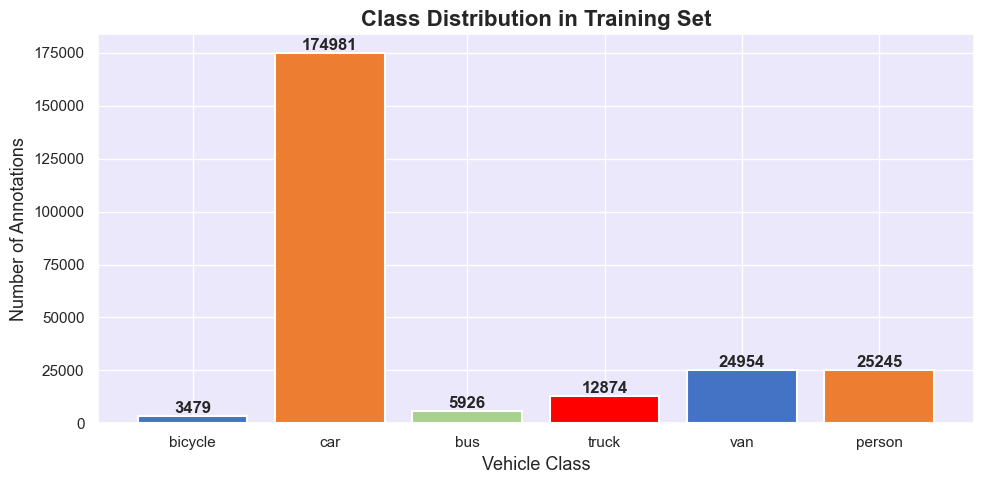


📊 Class Counts: {'bicycle': 3479, 'car': 174981, 'bus': 5926, 'truck': 12874, 'van': 24954, 'person': 25245}


In [7]:
# Count class distribution in training set
class_counts = {name: 0 for name in CLASS_NAMES}

for label_file in os.listdir(train_lbl_path):
    if label_file.endswith('.txt'):
        with open(os.path.join(train_lbl_path, label_file), 'r') as f:
            for line in f.readlines():
                class_id = int(line.strip().split()[0])
                class_counts[CLASS_NAMES[class_id]] += 1

# Plot class distribution
plt.figure(figsize=(10, 5))
colors = ['#4472C4', '#ED7D31', '#A9D18E', '#FF0000']
bars = plt.bar(class_counts.keys(), class_counts.values(), color=colors[:len(CLASS_NAMES)], edgecolor='white', linewidth=1.5)
plt.title('Class Distribution in Training Set', fontsize=16, fontweight='bold')
plt.xlabel('Vehicle Class', fontsize=13)
plt.ylabel('Number of Annotations', fontsize=13)
for bar, count in zip(bars, class_counts.values()):
    plt.text(bar.get_x() + bar.get_width()/2., bar.get_height() + 50,
             str(count), ha='center', va='bottom', fontsize=12, fontweight='bold')
plt.tight_layout()
plt.show()
print("\n📊 Class Counts:", class_counts)

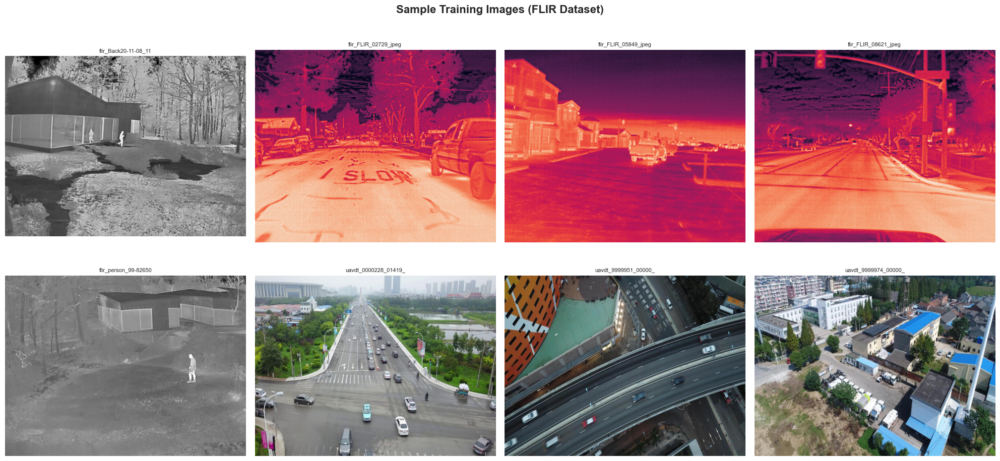

In [8]:
# Show sample training images
selected = train_images[::max(1, len(train_images)//8)][:8]

fig, axes = plt.subplots(2, 4, figsize=(20, 10))
for ax, img_file in zip(axes.ravel(), selected):
    img = Image.open(os.path.join(train_img_path, img_file))
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(img_file[:20], fontsize=8)

plt.suptitle('Sample Training Images (FLIR Dataset)', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

## Step 3B | 🌗 Image Preprocessing — Low Light & Noise Robustness
> **Research Contribution:** Paper's limitation was lighting conditions. We solve this with CLAHE + Gamma correction.


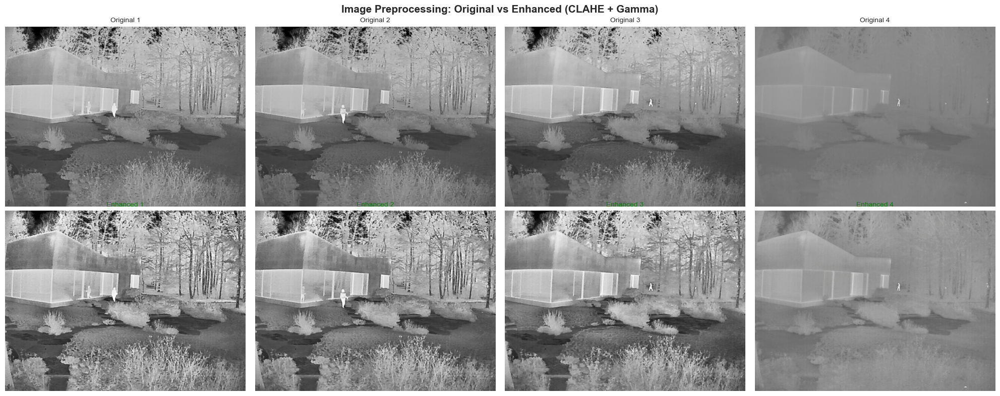

✅ Preprocessing pipeline ready!


In [9]:
# =====================================================
# IMPROVEMENT 4: Image Preprocessing Pipeline
# Handles low-light, excessive brightness, noise
# =====================================================

def apply_clahe(image):
    """Apply CLAHE - improves visibility in dark/overcast conditions."""
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    l_clahe = clahe.apply(l)
    enhanced = cv2.merge([l_clahe, a, b])
    return cv2.cvtColor(enhanced, cv2.COLOR_LAB2BGR)

def gamma_correction(image, gamma=1.2):
    """Gamma correction to brighten underexposed images."""
    inv_gamma = 1.0 / gamma
    table = np.array([(i / 255.0) ** inv_gamma * 255
                      for i in range(256)]).astype('uint8')
    return cv2.LUT(image, table)

def preprocess_image(image):
    """Full preprocessing pipeline."""
    img = apply_clahe(image)
    img = gamma_correction(img, gamma=1.15)
    return img

# ── Visualize on 4 sample images (valid_img_path already defined in Step 3) ──
_sample_files = [f for f in os.listdir(valid_img_path)
                 if f.endswith(('.jpg', '.png', '.jpeg'))][:4]
sample_paths = [os.path.join(valid_img_path, f) for f in _sample_files]

fig, axes = plt.subplots(2, 4, figsize=(20, 8))
fig.suptitle('Image Preprocessing: Original vs Enhanced (CLAHE + Gamma)',
             fontsize=15, fontweight='bold')

for i, img_path in enumerate(sample_paths):
    orig     = cv2.imread(img_path)
    enhanced = preprocess_image(orig)
    axes[0, i].imshow(cv2.cvtColor(orig,     cv2.COLOR_BGR2RGB))
    axes[0, i].set_title(f'Original {i+1}',  fontsize=10)
    axes[0, i].axis('off')
    axes[1, i].imshow(cv2.cvtColor(enhanced, cv2.COLOR_BGR2RGB))
    axes[1, i].set_title(f'Enhanced {i+1}',  fontsize=10, color='green')
    axes[1, i].axis('off')

plt.tight_layout()
plt.show()
print('✅ Preprocessing pipeline ready!')


C:\Users\sjyot\anaconda3\lib\site-packages\ultralytics\nn\tasks.py:714: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(file, map_location="cpu")


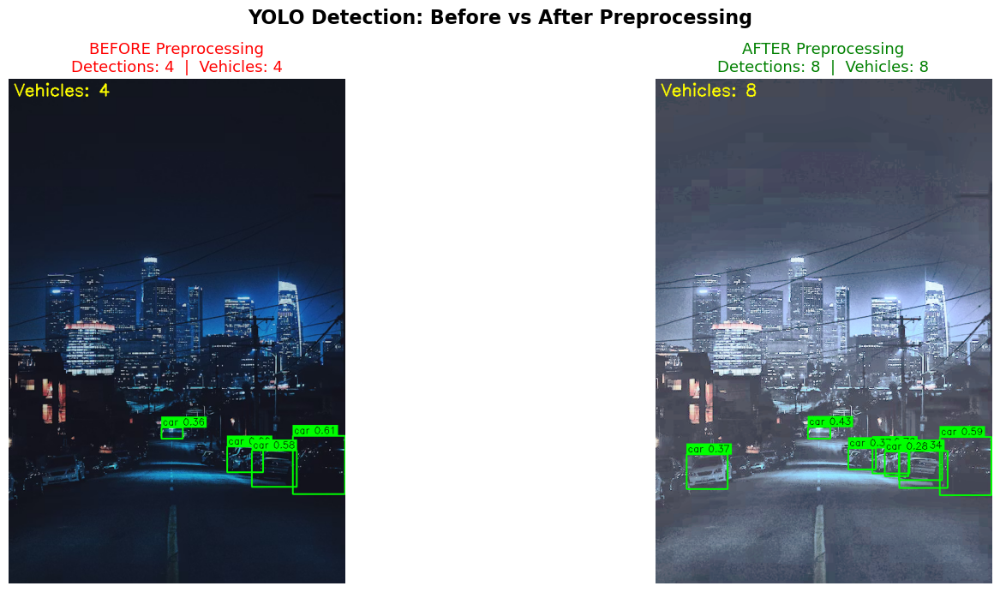

Metric                      Before     After
Total Detections                 4         8
Vehicle Count                    4         8
Improvement                          +100.0%
✅ Comparison saved as 'detection_comparison.png'


In [8]:
# ╔══════════════════════════════════════════════════════════════════════════╗
# ║  CELL 3C-4 | YOLO Detection — Before vs After Preprocessing           ║
# ║  Proves ki preprocessing se detection improve hoti hai                 ║
# ╚══════════════════════════════════════════════════════════════════════════╝

IMAGE_PATH = r"C:\Users\sjyot\Sidhants_Project\Major_Sid_Main\Dark_img_2_jpg.jpg"  # <-- apna path

from PIL import Image as PILImage
import numpy as np, cv2, matplotlib.pyplot as plt
from ultralytics import YOLO

# ── Load model (Step 4 mein jo load kiya tha) ────────────────────────────────
detect_model = YOLO('yolov8n.pt')  # already downloaded hoga

# ── Load image ────────────────────────────────────────────────────────────────
def load_any_image(path):
    img_pil = PILImage.open(path).convert("RGB")
    return np.array(img_pil)[:, :, ::-1]

# ── Preprocessing (same jo 3C-1 mein use kiya) ───────────────────────────────
def fix_low_light(image):
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=3.5, tileGridSize=(8, 8))
    lab_out = cv2.merge([clahe.apply(l), a, b])
    img_clahe = cv2.cvtColor(lab_out, cv2.COLOR_LAB2BGR)
    table = np.array([(i/255.0)**(1/1.8)*255 for i in range(256)]).astype('uint8')
    return cv2.LUT(img_clahe, table)

# ── YOLO inference function ───────────────────────────────────────────────────
VEHICLE_CLASSES = ['bicycle', 'car', 'bus', 'truck', 'motorcycle']
COCO_VEHICLE_IDS = [1, 2, 3, 5, 7]  # COCO class ids for vehicles

def run_yolo_and_draw(image_bgr, title):
    """Run YOLO and draw bounding boxes. Returns annotated image + count."""
    img_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
    results = detect_model(img_rgb, verbose=False)[0]

    annotated = image_bgr.copy()
    count = 0

    COLORS = {
        'car':        (0, 255, 0),
        'bus':        (255, 165, 0),
        'truck':      (0, 0, 255),
        'bicycle':    (255, 0, 255),
        'motorcycle': (0, 255, 255),
        'person':     (200, 200, 200),
    }

    for box in results.boxes:
        cls_name = detect_model.names[int(box.cls)]
        conf     = float(box.conf)
        if conf < 0.25:
            continue

        x1, y1, x2, y2 = map(int, box.xyxy[0])
        color = COLORS.get(cls_name, (255, 255, 255))

        # Bounding box
        cv2.rectangle(annotated, (x1, y1), (x2, y2), color, 2)

        # Label background
        label = f"{cls_name} {conf:.2f}"
        (tw, th), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.55, 1)
        cv2.rectangle(annotated, (x1, y1-th-6), (x1+tw+4, y1), color, -1)
        cv2.putText(annotated, label, (x1+2, y1-4),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.55, (0, 0, 0), 1)

        if cls_name in VEHICLE_CLASSES:
            count += 1

    # Detection count on image
    cv2.putText(annotated, f"Vehicles: {count}", (10, 30),
                cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0, 255, 255), 2)

    return annotated, count, len(results.boxes)

# ── Run on ORIGINAL ───────────────────────────────────────────────────────────
orig        = load_any_image(IMAGE_PATH)
enhanced    = fix_low_light(orig)

ann_orig,  veh_orig,  total_orig  = run_yolo_and_draw(orig,     "Original")
ann_fixed, veh_fixed, total_fixed = run_yolo_and_draw(enhanced, "Enhanced")

# ── Side by side plot ─────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(18, 7))
fig.suptitle('YOLO Detection: Before vs After Preprocessing', fontsize=16, fontweight='bold')

axes[0].imshow(cv2.cvtColor(ann_orig,  cv2.COLOR_BGR2RGB))
axes[0].set_title(f'BEFORE Preprocessing\nDetections: {total_orig}  |  Vehicles: {veh_orig}',
                  fontsize=13, color='red')
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(ann_fixed, cv2.COLOR_BGR2RGB))
axes[1].set_title(f'AFTER Preprocessing\nDetections: {total_fixed}  |  Vehicles: {veh_fixed}',
                  fontsize=13, color='green')
axes[1].axis('off')

plt.tight_layout()
plt.savefig('detection_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

# ── Summary table ─────────────────────────────────────────────────────────────
print("=" * 45)
print(f"{'Metric':<25} {'Before':>8}  {'After':>8}")
print("=" * 45)
print(f"{'Total Detections':<25} {total_orig:>8}  {total_fixed:>8}")
print(f"{'Vehicle Count':<25} {veh_orig:>8}  {veh_fixed:>8}")
if total_orig > 0:
    imp = ((total_fixed - total_orig) / total_orig) * 100
    print(f"{'Improvement':<25} {'':>8}  {imp:>+7.1f}%")
print("=" * 45)
print("✅ Comparison saved as 'detection_comparison.png'")

C:\Users\sjyot\anaconda3\lib\site-packages\ultralytics\nn\tasks.py:714: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(file, map_location="cpu")


Image brightness: 116.3/255
⚠️ Warning: Image already normal brightness — overexposure fix strong effect nahi dikhayega


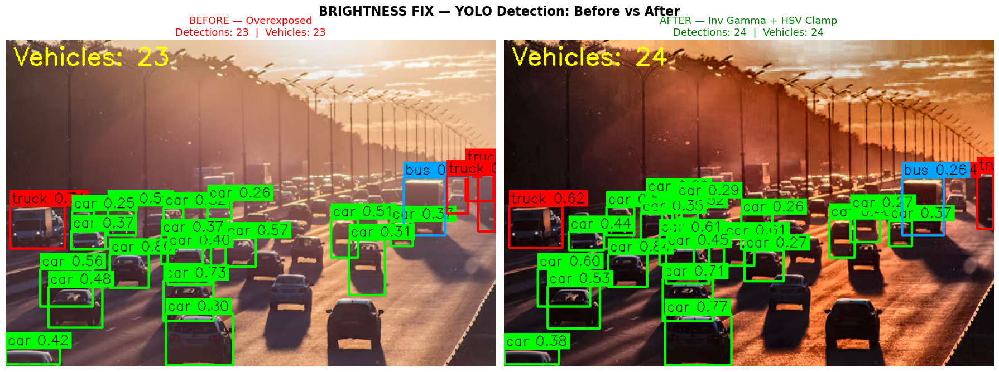

Metric                      Before     After
Total Detections                23        24
Vehicle Count                   23        24
Improvement                            +4.3%
✅ Saved: brightness_detection_comparison.png


In [9]:
# ╔══════════════════════════════════════════════════════════════════════════╗
# ║  CELL 3C-4B | YOLO Detection — EXCESSIVE BRIGHTNESS Before vs After   ║
# ╚══════════════════════════════════════════════════════════════════════════╝

IMAGE_PATH = r"C:\Users\sjyot\Sidhants_Project\Major_Sid_Main\Excessive_light_img_jpg.jpg"  # <-- CHANGE THIS

from PIL import Image as PILImage
import numpy as np, cv2, matplotlib.pyplot as plt
from ultralytics import YOLO

detect_model = YOLO('yolov8n.pt')

def load_any_image(path):
    img_pil = PILImage.open(path).convert("RGB")
    return np.array(img_pil)[:, :, ::-1]

def fix_excessive_brightness(image):
    avg = image.mean()
    print(f"Image brightness: {avg:.1f}/255")
    if avg < 170:
        print("⚠️ Warning: Image already normal brightness — overexposure fix strong effect nahi dikhayega")
    # Inverse Gamma — darkens image
    table = np.array([(i/255.0)**(1/0.5)*255 for i in range(256)]).astype('uint8')
    img_dark = cv2.LUT(image, table)
    # HSV V-channel clamp
    hsv = cv2.cvtColor(img_dark, cv2.COLOR_BGR2HSV).astype(np.float32)
    hsv[:,:,2] = np.clip(hsv[:,:,2], 0, 210)
    hsv[:,:,1] = np.clip(hsv[:,:,1]*1.2, 0, 255)
    img_fixed = cv2.cvtColor(hsv.astype(np.uint8), cv2.COLOR_HSV2BGR)
    # CLAHE to recover contrast
    lab = cv2.cvtColor(img_fixed, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    lab_out = cv2.merge([clahe.apply(l), a, b])
    return cv2.cvtColor(lab_out, cv2.COLOR_LAB2BGR)

VEHICLE_CLASSES = ['bicycle', 'car', 'bus', 'truck', 'motorcycle']

def run_yolo_and_draw(image_bgr):
    img_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
    results = detect_model(img_rgb, verbose=False)[0]
    annotated = image_bgr.copy()
    count = 0
    COLORS = {'car':(0,255,0),'bus':(255,165,0),'truck':(0,0,255),'bicycle':(255,0,255),'motorcycle':(0,255,255),'person':(200,200,200)}
    for box in results.boxes:
        cls_name = detect_model.names[int(box.cls)]
        conf = float(box.conf)
        if conf < 0.25: continue
        x1,y1,x2,y2 = map(int, box.xyxy[0])
        color = COLORS.get(cls_name, (255,255,255))
        cv2.rectangle(annotated, (x1,y1), (x2,y2), color, 2)
        label = f"{cls_name} {conf:.2f}"
        (tw,th),_ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.55, 1)
        cv2.rectangle(annotated, (x1,y1-th-6), (x1+tw+4,y1), color, -1)
        cv2.putText(annotated, label, (x1+2,y1-4), cv2.FONT_HERSHEY_SIMPLEX, 0.55, (0,0,0), 1)
        if cls_name in VEHICLE_CLASSES: count += 1
    cv2.putText(annotated, f"Vehicles: {count}", (10,30), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0,255,255), 2)
    return annotated, count, len(results.boxes)

orig     = load_any_image(IMAGE_PATH)
enhanced = fix_excessive_brightness(orig)

ann_orig,  veh_orig,  total_orig  = run_yolo_and_draw(orig)
ann_fixed, veh_fixed, total_fixed = run_yolo_and_draw(enhanced)

fig, axes = plt.subplots(1, 2, figsize=(18, 7))
fig.suptitle('BRIGHTNESS FIX — YOLO Detection: Before vs After', fontsize=16, fontweight='bold')
axes[0].imshow(cv2.cvtColor(ann_orig,  cv2.COLOR_BGR2RGB))
axes[0].set_title(f'BEFORE — Overexposed\nDetections: {total_orig}  |  Vehicles: {veh_orig}', fontsize=13, color='red')
axes[0].axis('off')
axes[1].imshow(cv2.cvtColor(ann_fixed, cv2.COLOR_BGR2RGB))
axes[1].set_title(f'AFTER — Inv Gamma + HSV Clamp\nDetections: {total_fixed}  |  Vehicles: {veh_fixed}', fontsize=13, color='green')
axes[1].axis('off')
plt.tight_layout()
plt.savefig('brightness_detection_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

print("=" * 45)
print(f"{'Metric':<25} {'Before':>8}  {'After':>8}")
print("=" * 45)
print(f"{'Total Detections':<25} {total_orig:>8}  {total_fixed:>8}")
print(f"{'Vehicle Count':<25} {veh_orig:>8}  {veh_fixed:>8}")
if total_orig > 0:
    imp = ((total_fixed - total_orig) / total_orig) * 100
    print(f"{'Improvement':<25} {'':>8}  {imp:>+7.1f}%")
print("=" * 45)
print("✅ Saved: brightness_detection_comparison.png")

C:\Users\sjyot\anaconda3\lib\site-packages\ultralytics\nn\tasks.py:714: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(file, map_location="cpu")


Image brightness: 63.2/255
Step 1: Dehazing (Dark Channel Prior)...
  Guided filter unavailable (module 'cv2.ximgproc' has no attribute 'guidedFilter'), using basic dehaze...
Step 2: CLAHE for contrast...
Step 3: Sharpening edges...


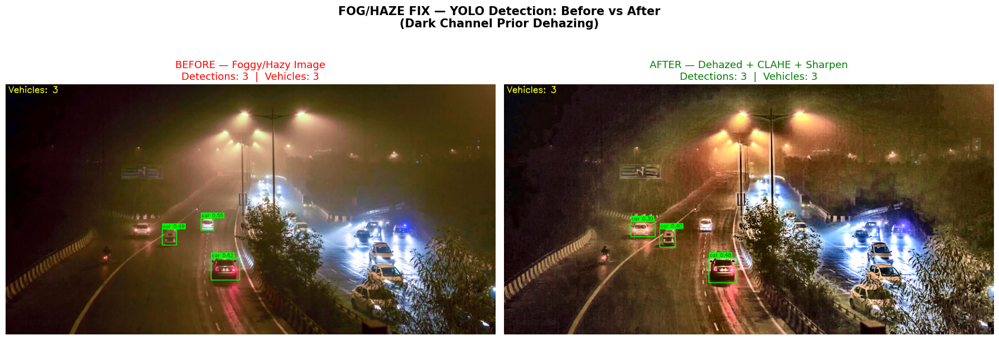

Metric                      Before     After
Total Detections                 3         3
Vehicle Count                    3         3
Improvement                            +0.0%
✅ Saved: fog_detection_comparison.png


In [15]:
# ╔══════════════════════════════════════════════════════════════════════════╗
# ║  CELL 3C-4C | YOLO Detection — FOG/HAZE/NOISE Before vs After         ║
# ╚══════════════════════════════════════════════════════════════════════════╝

IMAGE_PATH = r"C:\Users\sjyot\Sidhants_Project\Major_Sid_Main\noisy_img_3.jpg"  # <-- CHANGE THIS

from PIL import Image as PILImage
import numpy as np, cv2, matplotlib.pyplot as plt
from ultralytics import YOLO

detect_model = YOLO('yolov8n.pt')

def load_any_image(path):
    img_pil = PILImage.open(path).convert("RGB")
    return np.array(img_pil)[:, :, ::-1]

def dehaze_dark_channel(image, patch_size=15, omega=0.85, t_min=0.1):
    """
    Dark Channel Prior Dehazing — fog/haze remove karta hai.
    He et al. CVPR 2009 — standard dehazing algorithm.
    """
    img_float = image.astype(np.float64) / 255.0

    # Step 1: Dark channel — minimum over local patch
    def dark_channel(img, size):
        min_ch = np.min(img, axis=2)
        kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (size, size))
        return cv2.erode(min_ch.astype(np.float32), kernel)

    dark = dark_channel(img_float, patch_size)

    # Step 2: Atmospheric light — brightest pixels in dark channel
    num_pixels = dark.size
    num_bright = max(int(num_pixels * 0.001), 1)
    flat_dark  = dark.flatten()
    flat_img   = img_float.reshape(-1, 3)
    bright_idx = np.argsort(flat_dark)[-num_bright:]
    A = np.max(flat_img[bright_idx], axis=0)
    A = np.clip(A, 0.1, 1.0)

    # Step 3: Transmission map
    norm_img = img_float / A
    t = 1.0 - omega * dark_channel(norm_img, patch_size)
    t = np.clip(t, t_min, 1.0)

    # Step 4: Soft matting via guided filter (faster approximation)
    t_refined = cv2.ximgproc.guidedFilter(
        guide=image[:,:,1].astype(np.float32)/255.0,
        src=t.astype(np.float32),
        radius=40, eps=1e-3
    ) if hasattr(cv2, 'ximgproc') else t

    # Step 5: Scene radiance recovery
    t3 = np.stack([t_refined]*3, axis=2)
    J  = (img_float - A) / t3 + A
    J  = np.clip(J, 0, 1)
    return (J * 255).astype(np.uint8)

def fix_fog_noise(image):
    """Combined pipeline: Dehaze → CLAHE → Sharpen"""
    print("Step 1: Dehazing (Dark Channel Prior)...")
    try:
        dehazed = dehaze_dark_channel(image)
    except Exception as e:
        print(f"  Guided filter unavailable ({e}), using basic dehaze...")
        # Fallback without guided filter
        img_float = image.astype(np.float64) / 255.0
        dark = np.min(image, axis=2).astype(np.float64) / 255.0
        kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (15,15))
        dark_ch = cv2.erode(dark.astype(np.float32), kernel)
        A = 0.85
        t = np.clip(1.0 - 0.85 * dark_ch, 0.1, 1.0)
        t3 = np.stack([t]*3, axis=2)
        J = (img_float - A) / t3 + A
        dehazed = (np.clip(J, 0, 1) * 255).astype(np.uint8)

    print("Step 2: CLAHE for contrast...")
    lab = cv2.cvtColor(dehazed, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.5, tileGridSize=(8,8))
    dehazed_clahe = cv2.cvtColor(cv2.merge([clahe.apply(l), a, b]), cv2.COLOR_LAB2BGR)

    print("Step 3: Sharpening edges...")
    blur  = cv2.GaussianBlur(dehazed_clahe, (0,0), sigmaX=2)
    sharp = cv2.addWeighted(dehazed_clahe, 1.4, blur, -0.4, 0)

    return sharp

VEHICLE_CLASSES = ['bicycle', 'car', 'bus', 'truck', 'motorcycle']

def run_yolo_and_draw(image_bgr):
    img_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
    results = detect_model(img_rgb, verbose=False)[0]
    annotated = image_bgr.copy()
    count = 0
    COLORS = {'car':(0,255,0),'bus':(255,165,0),'truck':(0,0,255),
              'bicycle':(255,0,255),'motorcycle':(0,255,255),'person':(200,200,200)}
    for box in results.boxes:
        cls_name = detect_model.names[int(box.cls)]
        conf = float(box.conf)
        if conf < 0.25: continue
        x1,y1,x2,y2 = map(int, box.xyxy[0])
        color = COLORS.get(cls_name, (255,255,255))
        cv2.rectangle(annotated, (x1,y1), (x2,y2), color, 2)
        label = f"{cls_name} {conf:.2f}"
        (tw,th),_ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.55, 1)
        cv2.rectangle(annotated, (x1,y1-th-6), (x1+tw+4,y1), color, -1)
        cv2.putText(annotated, label, (x1+2,y1-4), cv2.FONT_HERSHEY_SIMPLEX, 0.55, (0,0,0), 1)
        if cls_name in VEHICLE_CLASSES: count += 1
    cv2.putText(annotated, f"Vehicles: {count}", (10,30),
                cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0,255,255), 2)
    return annotated, count, len(results.boxes)

# ── Run ───────────────────────────────────────────────────────────────────────
orig     = load_any_image(IMAGE_PATH)
print(f"Image brightness: {orig.mean():.1f}/255")
enhanced = fix_fog_noise(orig)

ann_orig,  veh_orig,  total_orig  = run_yolo_and_draw(orig)
ann_fixed, veh_fixed, total_fixed = run_yolo_and_draw(enhanced)

fig, axes = plt.subplots(1, 2, figsize=(18, 7))
fig.suptitle('FOG/HAZE FIX — YOLO Detection: Before vs After\n(Dark Channel Prior Dehazing)', fontsize=15, fontweight='bold')
axes[0].imshow(cv2.cvtColor(ann_orig,  cv2.COLOR_BGR2RGB))
axes[0].set_title(f'BEFORE — Foggy/Hazy Image\nDetections: {total_orig}  |  Vehicles: {veh_orig}', fontsize=13, color='red')
axes[0].axis('off')
axes[1].imshow(cv2.cvtColor(ann_fixed, cv2.COLOR_BGR2RGB))
axes[1].set_title(f'AFTER — Dehazed + CLAHE + Sharpen\nDetections: {total_fixed}  |  Vehicles: {veh_fixed}', fontsize=13, color='green')
axes[1].axis('off')
plt.tight_layout()
plt.savefig('fog_detection_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

print("=" * 45)
print(f"{'Metric':<25} {'Before':>8}  {'After':>8}")
print("=" * 45)
print(f"{'Total Detections':<25} {total_orig:>8}  {total_fixed:>8}")
print(f"{'Vehicle Count':<25} {veh_orig:>8}  {veh_fixed:>8}")
if total_orig > 0:
    imp = ((total_fixed - total_orig) / total_orig) * 100
    print(f"{'Improvement':<25} {'':>8}  {imp:>+7.1f}%")
print("=" * 45)
print("✅ Saved: fog_detection_comparison.png")

## Step 4 | Load YOLOv8 Pretrained Model

In [10]:
# Load YOLOv8 nano pretrained on COCO
model = YOLO('yolov8n.pt')
print("✅ YOLOv8n pretrained model loaded!")
print(f"Model type: {type(model)}")

✅ YOLOv8n pretrained model loaded!
Model type: <class 'ultralytics.models.yolo.model.YOLO'>


## Step 4B | 🔧 Smart Duplicate Detection Removal (NMS)
> **Paper's exact problem:** *'Both models showing duplicate detections — same object detected in two categories at same time'*  
> **Our solution:** IoU-based Non-Maximum Suppression to keep only the highest-confidence box.


In [11]:
# =====================================================
# IMPROVEMENT 2: IoU-based Duplicate Removal
# Removes overlapping boxes from same or diff models
# =====================================================

def compute_iou(box1, box2):
    """Compute IoU between two boxes [x1,y1,x2,y2]."""
    xi1 = max(box1[0], box2[0]);  yi1 = max(box1[1], box2[1])
    xi2 = min(box1[2], box2[2]);  yi2 = min(box1[3], box2[3])
    inter = max(0, xi2 - xi1) * max(0, yi2 - yi1)
    area1 = (box1[2]-box1[0]) * (box1[3]-box1[1])
    area2 = (box2[2]-box2[0]) * (box2[3]-box2[1])
    union = area1 + area2 - inter
    return inter / union if union > 0 else 0

def remove_duplicate_detections(boxes, scores, labels, iou_threshold=0.5):
    """
    Remove duplicate detections using IoU threshold.
    If IoU > threshold → keep higher confidence box (paper's logic).
    boxes  : list of [x1, y1, x2, y2]
    scores : list of confidence scores
    labels : list of class names
    """
    if len(boxes) == 0:
        return [], [], []

    # Sort by confidence descending
    order = sorted(range(len(scores)), key=lambda i: scores[i], reverse=True)
    keep = []

    while order:
        i = order.pop(0)
        keep.append(i)
        order = [j for j in order
                 if compute_iou(boxes[i], boxes[j]) < iou_threshold]

    return ([boxes[k]  for k in keep],
            [scores[k] for k in keep],
            [labels[k] for k in keep])

print('✅ Smart duplicate removal (IoU-NMS) ready!')
print('   Threshold set to 0.5 — matching paper\'s coordinate-diff approach')


✅ Smart duplicate removal (IoU-NMS) ready!
   Threshold set to 0.5 — matching paper's coordinate-diff approach


## Step 5 | Fine-Tune YOLOv8 on FLIR Dataset

In [15]:
import yaml

# Tera actual merged dataset path
ACTUAL_PATH = r"C:\Users\sjyot\Sidhants_Project\Final_merged_dataset\merged_dataset"

# data_merged.yaml ke paths fix karo
yaml_path = os.path.join(ACTUAL_PATH, 'data_merged.yaml')

with open(yaml_path, 'r') as f:
    data_config = yaml.safe_load(f)

# Paths update karo
data_config['train'] = os.path.join(ACTUAL_PATH, 'train', 'images').replace('\\', '/')
data_config['val']   = os.path.join(ACTUAL_PATH, 'valid', 'images').replace('\\', '/')
data_config['test']  = os.path.join(ACTUAL_PATH, 'test',  'images').replace('\\', '/')

with open(yaml_path, 'w') as f:
    yaml.dump(data_config, f, default_flow_style=False, sort_keys=False)

updated_yaml_path = yaml_path

print("✅ Paths fixed!")
print(f"   Train: {data_config['train']}")
print(f"   Val  : {data_config['val']}")

✅ Paths fixed!
   Train: C:/Users/sjyot/Sidhants_Project/Final_merged_dataset/merged_dataset/train/images
   Val  : C:/Users/sjyot/Sidhants_Project/Final_merged_dataset/merged_dataset/valid/images


In [16]:
# =====================================================
# TRAINING - Fine-tune YOLOv8 on Merged 6-class dataset
# =====================================================
print("🚀 Starting Training...")
print(f"Device: {'GPU (CUDA)' if DEVICE == 0 else 'CPU'}")
print(f"Dataset: {updated_yaml_path}")
print("="*50)
print(f"Classes: {CLASS_NAMES}")
print("="*50)

results = model.train(
    data    = updated_yaml_path,
    epochs  = 50,
    imgsz   = 640,
    batch   = 16,
    device  = DEVICE,
    project = 'traffic_density',
    name    = 'merged_6class',
    exist_ok= True,
    patience= 10,
    verbose = True,
)

train_results_path = r"C:\Users\sjyot\Sidhants_Project\Final_merged_dataset\merged_dataset\results"
print(f"\n✅ Training complete!")
print(f"   Results saved to: {train_results_path}")


🚀 Starting Training...
Device: GPU (CUDA)
Dataset: C:\Users\sjyot\Sidhants_Project\Final_merged_dataset\merged_dataset\data_merged.yaml
Classes: ['bicycle', 'car', 'bus', 'truck', 'van', 'person']
New https://pypi.org/project/ultralytics/8.4.45 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.1.25 🚀 Python-3.10.9 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
engine\trainer: task=detect, mode=train, model=yolov8n.pt, data=C:\Users\sjyot\Sidhants_Project\Final_merged_dataset\merged_dataset\data_merged.yaml, epochs=50, time=None, patience=10, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=traffic_density, name=merged_6class, exist_ok=True, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'


Overriding model.yaml nc=80 with nc=6

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytic

train: Scanning C:\Users\sjyot\Sidhants_Project\Final_merged_dataset\merged_dataset\train\labels... 15662 images, 1173 

train: WARNING ⚠️ C:\Users\sjyot\Sidhants_Project\Final_merged_dataset\merged_dataset\train\images\flir_FLIR_05639_jpeg.rf.vI2ogNo1t7lTxPArr4F9.jpeg: 1 duplicate labels removed
train: WARNING ⚠️ C:\Users\sjyot\Sidhants_Project\Final_merged_dataset\merged_dataset\train\images\flir_FLIR_05812_jpeg.rf.t71N5ub2cMSZppsbZTIJ.jpeg: 1 duplicate labels removed
train: WARNING ⚠️ C:\Users\sjyot\Sidhants_Project\Final_merged_dataset\merged_dataset\train\images\flir_FLIR_07226_jpeg.rf.tncfU9DxkihW9XKaDWbt.jpeg: 1 duplicate labels removed
train: WARNING ⚠️ C:\Users\sjyot\Sidhants_Project\Final_merged_dataset\merged_dataset\train\images\flir_FLIR_07525_jpeg.rf.PbIDnaWyUa3W9XnnnXh3.jpeg: 1 duplicate labels removed
train: WARNING ⚠️ C:\Users\sjyot\Sidhants_Project\Final_merged_dataset\merged_dataset\train\images\flir_FLIR_09042_jpeg.rf.K5Od6whjszbrUkaaxvkA.jpeg: 1 duplicate labels removed
train: WARNING ⚠️ C:\Users\sjyot\Sidhants_Project\Final_merged_dataset\merged_dataset\train\images\flir_FLIR_09055_

train: New cache created: C:\Users\sjyot\Sidhants_Project\Final_merged_dataset\merged_dataset\train\labels.cache


INFO:albumentations.check_version:A new version of Albumentations is available: 2.0.8 (you have 1.4.10). Upgrade using: pip install --upgrade albumentations


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning C:\Users\sjyot\Sidhants_Project\Final_merged_dataset\merged_dataset\valid\labels... 2846 images, 234 back


val: New cache created: C:\Users\sjyot\Sidhants_Project\Final_merged_dataset\merged_dataset\valid\labels.cache
Plotting labels to traffic_density\merged_6class\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to traffic_density\merged_6class
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      5.49G      1.588      1.969      1.082        303        640: 100%|██████████| 979/979 [04:43<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:30


                   all       2846      32336      0.366      0.336      0.316      0.172

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      6.39G      1.533      1.404      1.049        372        640: 100%|██████████| 979/979 [15:35<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [02:03


                   all       2846      32336      0.437      0.377      0.364        0.2

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      5.51G      1.553      1.342      1.053        407        640: 100%|██████████| 979/979 [04:50<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:52


                   all       2846      32336      0.477      0.345      0.352      0.189

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      5.96G      1.548      1.281      1.056        239        640: 100%|██████████| 979/979 [05:01<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [01:12


                   all       2846      32336      0.496      0.368      0.376       0.21

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      4.42G      1.506      1.192       1.04        167        640: 100%|██████████| 979/979 [04:47<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:29


                   all       2846      32336       0.54      0.389      0.412      0.231

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      5.66G      1.474      1.141      1.033        330        640: 100%|██████████| 979/979 [04:15<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:28


                   all       2846      32336      0.548      0.415      0.435      0.246

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      5.77G      1.458      1.111      1.026        299        640: 100%|██████████| 979/979 [05:10<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:28


                   all       2846      32336      0.568      0.408      0.445      0.253

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      4.53G      1.438      1.079      1.017        363        640: 100%|██████████| 979/979 [53:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [01:17


                   all       2846      32336      0.597      0.435      0.473      0.271

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      4.06G      1.417      1.054       1.01        503        640: 100%|██████████| 979/979 [04:00<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:23


                   all       2846      32336      0.593      0.437      0.473      0.272

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      7.91G      1.406      1.038      1.007        388        640: 100%|██████████| 979/979 [04:52<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:27


                   all       2846      32336      0.586      0.441      0.475      0.275

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      5.05G      1.393       1.02      1.003        460        640: 100%|██████████| 979/979 [04:16<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:24


                   all       2846      32336       0.66      0.439      0.493      0.288

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      5.49G      1.384      1.009          1        532        640: 100%|██████████| 979/979 [20:34<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [01:04


                   all       2846      32336       0.62      0.461      0.506      0.294

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50       4.3G      1.378          1     0.9974        204        640: 100%|██████████| 979/979 [04:27<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:25


                   all       2846      32336      0.618      0.469      0.514      0.301

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      7.05G       1.37     0.9869     0.9949        293        640: 100%|██████████| 979/979 [04:48<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:31


                   all       2846      32336      0.647      0.456      0.515      0.304

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      6.09G       1.36     0.9758     0.9901        300        640: 100%|██████████| 979/979 [49:08<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [03:05


                   all       2846      32336      0.646      0.469      0.524      0.309

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      7.01G       1.35     0.9624     0.9883        303        640: 100%|██████████| 979/979 [04:14<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:26


                   all       2846      32336      0.654       0.48       0.53      0.313

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      5.57G      1.342     0.9562     0.9854        341        640: 100%|██████████| 979/979 [38:44<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [01:54

                   all       2846      32336      0.647      0.469      0.526      0.313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      5.85G       1.34     0.9447     0.9839        296        640: 100%|██████████| 979/979 [04:39<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:27


                   all       2846      32336      0.672      0.474      0.531      0.317

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      5.58G      1.334     0.9419     0.9823        409        640: 100%|██████████| 979/979 [05:10<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:31


                   all       2846      32336      0.652      0.489      0.538       0.32

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      7.94G      1.325      0.934     0.9791        214        640: 100%|██████████| 979/979 [04:26<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:26


                   all       2846      32336      0.672      0.487      0.543      0.324

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      6.51G      1.322     0.9304     0.9775        332        640: 100%|██████████| 979/979 [46:20<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [02:33

                   all       2846      32336      0.644        0.5      0.546      0.329



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      5.84G      1.319     0.9244     0.9752        206        640: 100%|██████████| 979/979 [04:09<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:25


                   all       2846      32336      0.685      0.494      0.552      0.331

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      5.06G      1.314     0.9163     0.9726        443        640: 100%|██████████| 979/979 [04:11<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:27


                   all       2846      32336      0.684      0.497       0.56      0.336

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      5.78G      1.312     0.9126      0.974        229        640: 100%|██████████| 979/979 [10:43<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [01:40


                   all       2846      32336      0.672       0.49      0.558      0.336

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      5.05G      1.302     0.9043      0.972        530        640: 100%|██████████| 979/979 [04:23<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:25

                   all       2846      32336      0.705      0.491      0.563      0.339



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      4.58G      1.296     0.9006     0.9694        436        640: 100%|██████████| 979/979 [31:31<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [01:42

                   all       2846      32336       0.67      0.505      0.564      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      6.33G      1.292     0.8919     0.9669        439        640: 100%|██████████| 979/979 [05:00<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:28

                   all       2846      32336      0.704      0.502       0.57      0.344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      6.53G      1.294     0.8934     0.9681        259        640: 100%|██████████| 979/979 [04:48<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:28


                   all       2846      32336      0.697       0.51      0.572      0.347

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      6.84G      1.289     0.8855      0.966        466        640: 100%|██████████| 979/979 [09:46<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:53


                   all       2846      32336      0.659      0.521      0.574      0.348

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      6.05G      1.285     0.8792     0.9645        451        640: 100%|██████████| 979/979 [18:17<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:23


                   all       2846      32336      0.687      0.516      0.577      0.349

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      4.63G      1.275     0.8708     0.9624        384        640: 100%|██████████| 979/979 [04:01<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:23

                   all       2846      32336      0.702      0.514      0.581      0.354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      5.74G      1.273     0.8647     0.9608        268        640: 100%|██████████| 979/979 [07:07<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:29

                   all       2846      32336        0.7      0.513      0.581      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      4.76G      1.271     0.8637       0.96        462        640: 100%|██████████| 979/979 [04:06<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:25

                   all       2846      32336      0.709      0.511      0.582      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50       5.7G      1.266     0.8545     0.9589        287        640: 100%|██████████| 979/979 [04:19<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:26

                   all       2846      32336      0.705      0.512      0.583      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      4.64G      1.265     0.8554     0.9569        422        640: 100%|██████████| 979/979 [04:06<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:25

                   all       2846      32336      0.697      0.523      0.586      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      5.05G      1.262     0.8504     0.9572        223        640: 100%|██████████| 979/979 [04:14<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:25

                   all       2846      32336      0.704      0.519      0.589      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      5.75G      1.255     0.8422     0.9549        314        640: 100%|██████████| 979/979 [04:25<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:27

                   all       2846      32336      0.683      0.528      0.589      0.361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      5.17G      1.254     0.8405     0.9539        212        640: 100%|██████████| 979/979 [04:10<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:23

                   all       2846      32336        0.7      0.524       0.59      0.361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      4.69G      1.249      0.838     0.9531        380        640: 100%|██████████| 979/979 [04:09<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:25

                   all       2846      32336      0.694      0.532      0.594      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      5.45G      1.249     0.8346      0.952        138        640: 100%|██████████| 979/979 [04:19<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:24

                   all       2846      32336      0.722      0.525      0.596      0.365


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      4.68G      1.221     0.8027     0.9504        194        640: 100%|██████████| 979/979 [28:55<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [01:05

                   all       2846      32336      0.725      0.529      0.597      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      5.01G      1.211     0.7928     0.9475        234        640: 100%|██████████| 979/979 [04:37<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:26


                   all       2846      32336      0.718       0.53      0.595      0.366

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      5.12G      1.209     0.7872     0.9461        244        640: 100%|██████████| 979/979 [31:50<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [03:02


                   all       2846      32336      0.727       0.53      0.597      0.367

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      5.35G      1.209     0.7828      0.946        148        640: 100%|██████████| 979/979 [04:17<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:28

                   all       2846      32336      0.732      0.527      0.598      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      5.04G      1.203     0.7757     0.9432        224        640: 100%|██████████| 979/979 [04:06<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:26

                   all       2846      32336      0.735      0.523      0.598      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      7.03G        1.2     0.7731     0.9418         88        640: 100%|██████████| 979/979 [04:28<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:30


                   all       2846      32336      0.725      0.525      0.597      0.369

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      5.39G      1.193     0.7659      0.942        155        640: 100%|██████████| 979/979 [31:21<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [03:17


                   all       2846      32336      0.726      0.525      0.598      0.368

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      4.34G      1.187     0.7603     0.9391         76        640: 100%|██████████| 979/979 [17:21<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [01:18


                   all       2846      32336       0.73      0.523      0.598      0.369

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      4.79G      1.186     0.7556     0.9388        201        640: 100%|██████████| 979/979 [30:39<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [02:20

                   all       2846      32336      0.722       0.53        0.6       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      5.83G      1.179     0.7496     0.9368        225        640: 100%|██████████| 979/979 [04:19<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:25

                   all       2846      32336      0.728      0.526        0.6       0.37



50 epochs completed in 10.687 hours.
Optimizer stripped from traffic_density\merged_6class\weights\last.pt, 6.2MB
Optimizer stripped from traffic_density\merged_6class\weights\best.pt, 6.2MB

Validating traffic_density\merged_6class\weights\best.pt...
Ultralytics YOLOv8.1.25 🚀 Python-3.10.9 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
Model summary (fused): 168 layers, 3006818 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:28


                   all       2846      32336      0.725      0.528        0.6       0.37
               bicycle       2846        978      0.751      0.654       0.72      0.349
                   car       2846      21773      0.827      0.737      0.817      0.549
                   bus       2846        251      0.762      0.398      0.499      0.345
                 truck       2846        750      0.548      0.236      0.286      0.187
                   van       2846       1975      0.641      0.344      0.408      0.277
                person       2846       6609      0.823      0.797      0.871      0.512
Speed: 0.5ms preprocess, 2.4ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to traffic_density\merged_6class

✅ Training complete!
   Results saved to: C:\Users\sjyot\Sidhants_Project\Final_merged_dataset\merged_dataset\results


## Step 6 | Model Performance Evaluation

In [17]:
# Path to training results
train_results_path = 'traffic_density/merged_6class'

# Load results CSV
results_csv = os.path.join(train_results_path, 'results.csv')
if not os.path.exists(results_csv):
    print("⚠️ Training results not found. Run training cell first.")
else:
    df = pd.read_csv(results_csv)
    df.columns = df.columns.str.strip()
    print("✅ Training results loaded!")
    print(f"   Epochs trained: {len(df)}")
    print(df[['epoch','train/box_loss','val/box_loss',
              'metrics/mAP50(B)','metrics/mAP50-95(B)']].tail(5))


✅ Training results loaded!
   Epochs trained: 50
    epoch  train/box_loss  val/box_loss  metrics/mAP50(B)  metrics/mAP50-95(B)
45     46          1.2002        1.1417           0.59719              0.36870
46     47          1.1929        1.1416           0.59766              0.36850
47     48          1.1871        1.1418           0.59794              0.36869
48     49          1.1857        1.1413           0.60028              0.36969
49     50          1.1792        1.1410           0.60018              0.37006


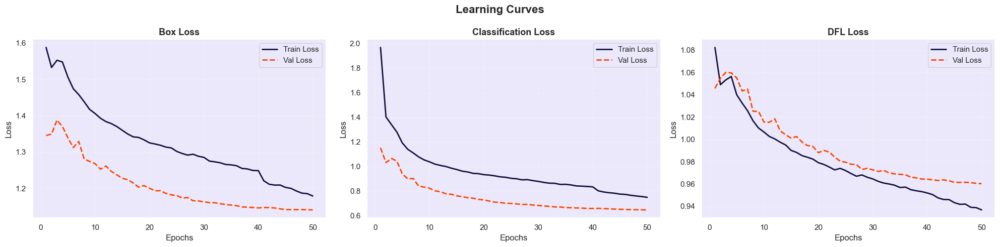

In [18]:
# Plot Learning Curves
fig, axes = plt.subplots(1, 3, figsize=(20, 5))

loss_pairs = [
    ('train/box_loss', 'val/box_loss', 'Box Loss'),
    ('train/cls_loss', 'val/cls_loss', 'Classification Loss'),
    ('train/dfl_loss', 'val/dfl_loss', 'DFL Loss'),
]

for ax, (train_col, val_col, title) in zip(axes, loss_pairs):
    ax.plot(df['epoch'], df[train_col], label='Train Loss', color='#141140', linewidth=2)
    ax.plot(df['epoch'], df[val_col], label='Val Loss', color='orangered', linewidth=2, linestyle='--')
    ax.set_title(title, fontsize=13, fontweight='bold')
    ax.set_xlabel('Epochs')
    ax.set_ylabel('Loss')
    ax.legend()
    ax.grid(True, alpha=0.3)

plt.suptitle('Learning Curves', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

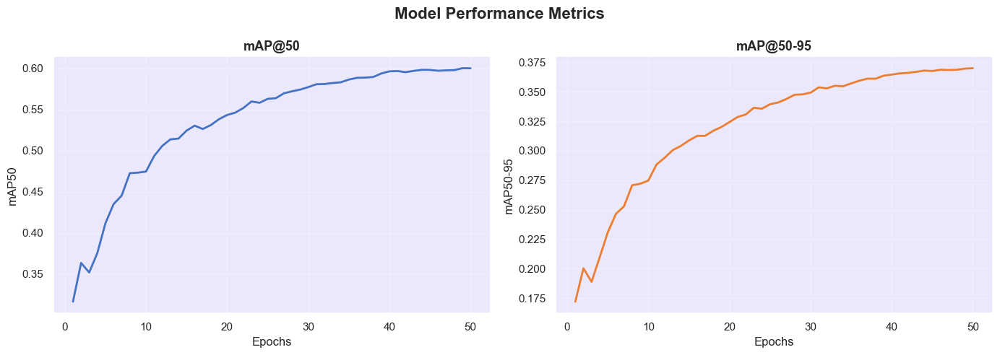


🏆 Best mAP50   : 0.6003
🏆 Best mAP50-95: 0.3701


In [19]:
# Plot mAP curves
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(df['epoch'], df['metrics/mAP50(B)'], color='#4472C4', linewidth=2)
axes[0].set_title('mAP@50', fontsize=13, fontweight='bold')
axes[0].set_xlabel('Epochs')
axes[0].set_ylabel('mAP50')
axes[0].grid(True, alpha=0.3)

axes[1].plot(df['epoch'], df['metrics/mAP50-95(B)'], color='#ED7D31', linewidth=2)
axes[1].set_title('mAP@50-95', fontsize=13, fontweight='bold')
axes[1].set_xlabel('Epochs')
axes[1].set_ylabel('mAP50-95')
axes[1].grid(True, alpha=0.3)

plt.suptitle('Model Performance Metrics', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

print(f"\n🏆 Best mAP50   : {df['metrics/mAP50(B)'].max():.4f}")
print(f"🏆 Best mAP50-95: {df['metrics/mAP50-95(B)'].max():.4f}")

In [20]:
# Load best model and validate
best_model_path = os.path.join(train_results_path, 'weights', 'best.pt')
best_model = YOLO(best_model_path)
print(f"✅ Best model loaded from: {best_model_path}")

# Validate on validation set
metrics = best_model.val(
    data  = updated_yaml_path,
    split = 'val'
)

print("\n📊 Validation Results (6-class merged dataset):")
print(f"   mAP@50     : {metrics.box.map50:.4f}")
print(f"   mAP@50-95  : {metrics.box.map:.4f}")
print(f"\nPer-class AP@50:")
for i, cls_name in enumerate(CLASS_NAMES):
    try:
        ap = metrics.box.ap50[i]
        tag = ' 🚗' if cls_name in TRAFFIC_CLASSES else ' (non-traffic)'
        print(f"   {cls_name:<10}: {ap:.4f}{tag}")
    except:
        pass


✅ Best model loaded from: traffic_density/merged_6class\weights\best.pt
Ultralytics YOLOv8.1.25 🚀 Python-3.10.9 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
Model summary (fused): 168 layers, 3006818 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning C:\Users\sjyot\Sidhants_Project\Final_merged_dataset\merged_dataset\valid\labels.cache... 2846 images, 23
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 178/178 [00:


                   all       2846      32336      0.723      0.531      0.601       0.37
               bicycle       2846        978      0.747       0.66      0.721      0.351
                   car       2846      21773      0.822       0.74      0.817       0.55
                   bus       2846        251      0.765      0.402      0.497      0.343
                 truck       2846        750      0.546      0.239      0.286      0.188
                   van       2846       1975      0.637      0.347      0.409      0.278
                person       2846       6609       0.82        0.8      0.872      0.512
Speed: 0.5ms preprocess, 3.9ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to C:\Users\sjyot\yolov5\runs\detect\val4

📊 Validation Results (6-class merged dataset):
   mAP@50     : 0.6005
   mAP@50-95  : 0.3703

Per-class AP@50:
   bicycle   : 0.7211 🚗
   car       : 0.8173 🚗
   bus       : 0.4972 🚗
   truck     : 0.2861 🚗
   van       : 0.4089 🚗
   pers

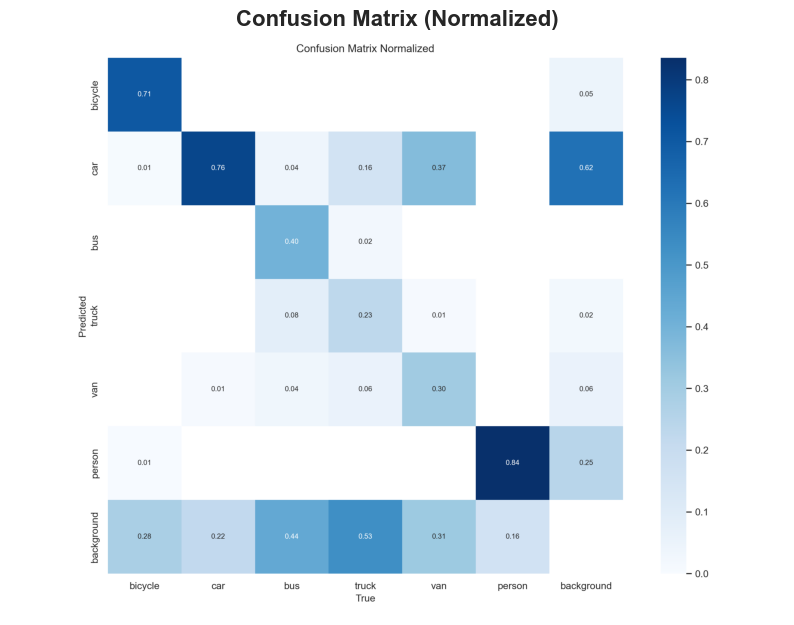

In [21]:
# Show confusion matrix
cm_path = os.path.join(train_results_path, 'confusion_matrix_normalized.png')
if os.path.exists(cm_path):
    cm_img = cv2.imread(cm_path)
    cm_img = cv2.cvtColor(cm_img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10, 8))
    plt.imshow(cm_img)
    plt.axis('off')
    plt.title('Confusion Matrix (Normalized)', fontsize=16, fontweight='bold')
    plt.show()
else:
    print("Confusion matrix image not found. Check training output folder.")

## Step 7 | Model Inference on Sample Images

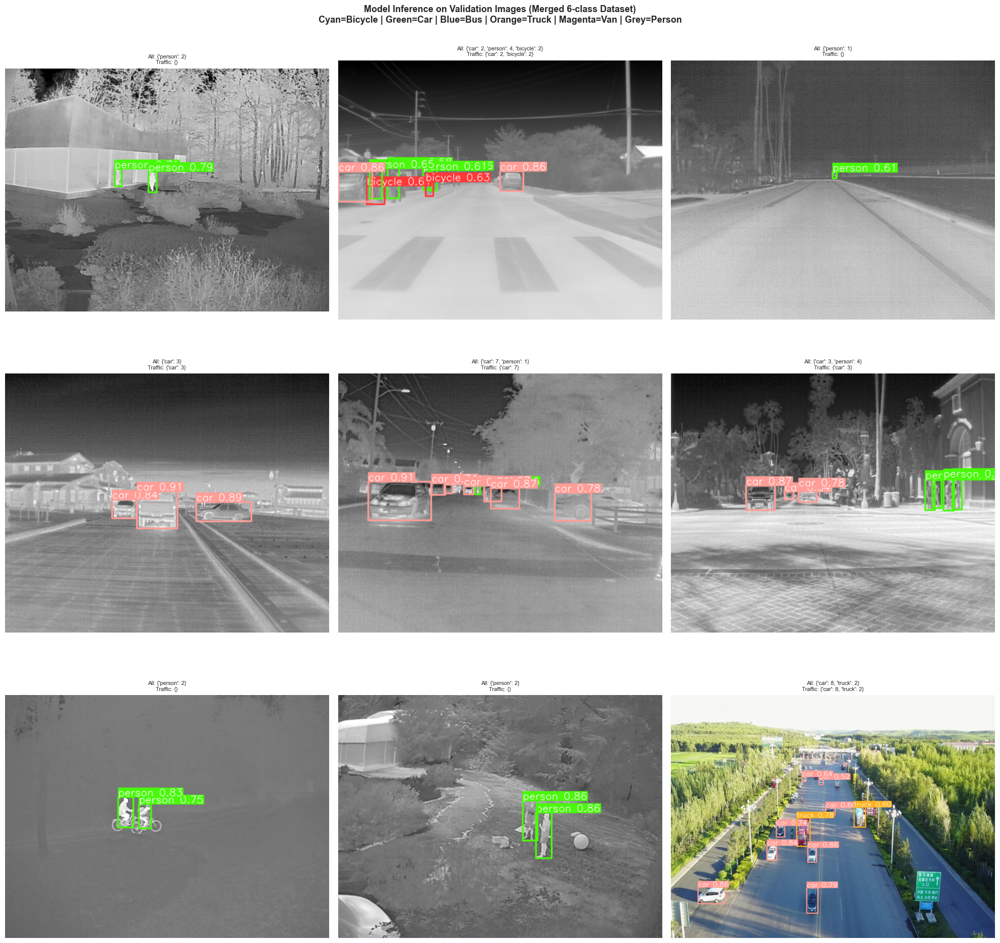

In [22]:
# Inference on validation images
valid_imgs = [f for f in os.listdir(valid_img_path) if f.endswith(('.jpg','.png','.jpeg'))]
selected_val = valid_imgs[::max(1, len(valid_imgs)//9)][:9]

# Class colors for 6 merged classes
CLASS_COLORS = {
    'bicycle': (255, 255,   0),   # Cyan
    'car'    : (  0, 255,   0),   # Green
    'bus'    : (255,   0,   0),   # Blue
    'truck'  : (  0, 165, 255),   # Orange
    'van'    : (255,   0, 255),   # Magenta
    'person' : (128, 128, 128),   # Grey (non-traffic)
}

fig, axes = plt.subplots(3, 3, figsize=(20, 20))
fig.suptitle(
    'Model Inference on Validation Images (Merged 6-class Dataset)\n'
    'Cyan=Bicycle | Green=Car | Blue=Bus | Orange=Truck | Magenta=Van | Grey=Person',
    fontsize=13, fontweight='bold'
)

for ax, img_file in zip(axes.ravel(), selected_val):
    img_path = os.path.join(valid_img_path, img_file)
    results  = best_model.predict(source=img_path, imgsz=640, conf=0.5, verbose=False)
    annotated_rgb = cv2.cvtColor(results[0].plot(line_width=2), cv2.COLOR_BGR2RGB)
    ax.imshow(annotated_rgb)
    ax.axis('off')
    counts = {}
    for cls_id in results[0].boxes.cls.int().tolist():
        name = CLASS_NAMES[cls_id]
        counts[name] = counts.get(name, 0) + 1
    traffic_only = {k: v for k, v in counts.items() if k in TRAFFIC_CLASSES}
    ax.set_title(f'All: {counts}\nTraffic: {traffic_only}', fontsize=8)

plt.tight_layout()
plt.show()


## Step 8A | 🔥 Ensemble Model: YOLOv8 + Faster R-CNN
> **Core Research Contribution:** Paper used Faster R-CNN + SSD ensemble.  
> We upgrade to **YOLOv8 (primary) + Faster R-CNN (secondary)** ensemble with majority-voting confidence scheme.
>
> **Ensemble Logic:**
> 1. Run YOLOv8 → get predictions
> 2. Run Faster R-CNN (torchvision) → get predictions  
> 3. Merge both prediction sets
> 4. Remove duplicates using IoU-NMS
> 5. Keep highest-confidence prediction per object (majority voting)


In [23]:
# =====================================================
# IMPROVEMENT 1: Ensemble YOLOv8 + Faster R-CNN
# =====================================================
import torchvision
from torchvision.models.detection import fasterrcnn_resnet50_fpn, FasterRCNN_ResNet50_FPN_Weights
import torchvision.transforms.functional as TF

print('⏳ Loading Faster R-CNN (pretrained COCO)...')
frcnn_model = fasterrcnn_resnet50_fpn(weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT)
frcnn_model.eval()
if torch.cuda.is_available():
    frcnn_model = frcnn_model.cuda()
print('✅ Faster R-CNN loaded!')

# COCO class IDs → our 6 merged class names
# COCO: 1=person, 2=bicycle, 3=car, 6=bus, 8=truck, 4=motorcycle(skip), 7=train(skip)
# van → closest COCO match is car(3) with large box heuristic
COCO_CLASS_MAP = {
    1 : 'person',    # COCO person  → class 5
    2 : 'bicycle',   # COCO bicycle → class 0
    3 : 'car',       # COCO car     → class 1
    6 : 'bus',       # COCO bus     → class 2
    8 : 'truck',     # COCO truck   → class 3
}

def get_frcnn_predictions(image_bgr, conf_threshold=0.5):
    img_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
    tensor  = TF.to_tensor(img_rgb).unsqueeze(0)
    if torch.cuda.is_available():
        tensor = tensor.cuda()
    with torch.no_grad():
        outputs = frcnn_model(tensor)[0]
    boxes, scores, labels = [], [], []
    for box, score, lid in zip(
            outputs['boxes'].cpu().numpy(),
            outputs['scores'].cpu().numpy(),
            outputs['labels'].cpu().numpy()):
        if score >= conf_threshold and int(lid) in COCO_CLASS_MAP:
            boxes.append(box.tolist())
            scores.append(float(score))
            labels.append(COCO_CLASS_MAP[int(lid)])
    return boxes, scores, labels

def get_yolo_predictions(image_bgr, conf_threshold=0.5):
    results = best_model.predict(source=image_bgr, imgsz=640, conf=conf_threshold, verbose=False)
    r = results[0]
    if len(r.boxes) == 0:
        return [], [], []
    boxes  = r.boxes.xyxy.cpu().numpy().tolist()
    scores = r.boxes.conf.cpu().numpy().tolist()
    labels = [CLASS_NAMES[int(c)] for c in r.boxes.cls.cpu().numpy()]
    return boxes, scores, labels

def ensemble_predict(image_bgr, conf_threshold=0.5, iou_threshold=0.5):
    preprocessed = preprocess_image(image_bgr)
    yolo_boxes,  yolo_scores,  yolo_labels  = get_yolo_predictions(preprocessed, conf_threshold)
    frcnn_boxes, frcnn_scores, frcnn_labels = get_frcnn_predictions(preprocessed, conf_threshold)
    all_boxes  = yolo_boxes  + frcnn_boxes
    all_scores = yolo_scores + frcnn_scores
    all_labels = yolo_labels + frcnn_labels
    final_boxes, final_scores, final_labels = remove_duplicate_detections(
        all_boxes, all_scores, all_labels, iou_threshold
    )
    return final_boxes, final_scores, final_labels

print('✅ Ensemble predict ready!')
print(f'   YOLOv8 detects: {CLASS_NAMES}')
print(f'   Faster R-CNN COCO map: {COCO_CLASS_MAP}')
print('   Note: van not in COCO — detected by YOLOv8 only')


⏳ Loading Faster R-CNN (pretrained COCO)...
✅ Faster R-CNN loaded!
✅ Ensemble predict ready!
   YOLOv8 detects: ['bicycle', 'car', 'bus', 'truck', 'van', 'person']
   Faster R-CNN COCO map: {1: 'person', 2: 'bicycle', 3: 'car', 6: 'bus', 8: 'truck'}
   Note: van not in COCO — detected by YOLOv8 only


## Step 8B | ⚖️ Weighted Traffic Density Formula (Paper-Inspired)
> **Paper formula:** `density = Σ (vehicle_category × n_units)`  
> **Our upgrade:** `density = Σ (vehicles × weight × lane_factor)` — more realistic
>
> | Vehicle | Units (Paper) | Our Weight |
> |---|---|---|
> | Cycle | 1 | — |
> | Two-Wheeler | 2 | — |
> | Car / Van | 4 | 4 |
> | Heavy Vehicle | 6 | 6 |
> | Bus | 10 | 10 |
> | Truck | 10 | 10 |


In [24]:
# =====================================================
# IMPROVEMENT 3: Weighted Traffic Density Formula
# Paper Table 2 logic — extended for 6-class merged dataset
# =====================================================

# Vehicle weights (paper Table 2 + extensions)
VEHICLE_WEIGHTS = {
    'bicycle': 1,    # Cycle       → 1 unit  (paper)
    'car'    : 4,    # Light vehicle→ 4 units (paper)
    'van'    : 6,    # Heavy vehicle→ 6 units (paper)
    'bus'    : 10,   # Bus         → 10 units (paper)
    'truck'  : 10,   # Truck       → 10 units (paper)
    'person' : 0,    # Non-vehicle → 0 (excluded from density)
}

def compute_weighted_density(class_counts, lane_count=2):
    """
    density = Σ (count_i × weight_i)  — paper formula
    person gets weight=0, so excluded automatically.
    """
    raw_density = sum(
        count * VEHICLE_WEIGHTS.get(cls, 0)
        for cls, count in class_counts.items()
    )
    return raw_density, round(raw_density / lane_count, 2)

def get_traffic_density_weighted(raw_density):
    if raw_density < 20:
        return 'LIGHT',    (0, 255, 0)
    elif raw_density <= 60:
        return 'MODERATE', (0, 165, 255)
    else:
        return 'HEAVY',    (0, 0, 255)

# Demo
demo = {'bicycle':2, 'car':3, 'bus':1, 'truck':1, 'van':2, 'person':4}
raw, per_lane = compute_weighted_density(demo)
level, _ = get_traffic_density_weighted(raw)
print('📊 Weighted Density Demo (6-class merged dataset):')
print(f'   Detections : {demo}')
print(f'   Formula    : bicycle×1 + car×4 + bus×10 + truck×10 + van×6')
print(f'   Calculation: {2*1}+{3*4}+{1*10}+{1*10}+{2*6} = {raw} units')
print(f'   Person     : weight=0 → NOT counted in density')
print(f'   Level      : {level}')


📊 Weighted Density Demo (6-class merged dataset):
   Detections : {'bicycle': 2, 'car': 3, 'bus': 1, 'truck': 1, 'van': 2, 'person': 4}
   Formula    : bicycle×1 + car×4 + bus×10 + truck×10 + van×6
   Calculation: 2+12+10+10+12 = 46 units
   Person     : weight=0 → NOT counted in density
   Level      : MODERATE


## Step 8 | 🚦 Real-Time Traffic Density Estimation

**Traffic Density Rules:**
- 🟢 **Light**    : Total vehicles < 10
- 🟡 **Moderate** : Total vehicles 10-20  
- 🔴 **Heavy**    : Total vehicles > 20

**Congestion Rules:**
- ✅ **No Congestion** : Density = Light or Moderate
- 🚨 **CONGESTED**    : Density = Heavy

In [26]:
# =====================================================
# TRAFFIC DENSITY ESTIMATION FUNCTIONS
# =====================================================
# =====================================================
# TRAFFIC DENSITY ESTIMATION FUNCTIONS
# =====================================================

def get_traffic_density(total_vehicles):
    if total_vehicles < 10:
        return 'LIGHT',    (0, 255, 0)
    elif total_vehicles <= 25:
        return 'MODERATE', (0, 165, 255)
    else:
        return 'HEAVY',    (0, 0, 255)

def get_congestion_status(density_level):
    if density_level == 'HEAVY':
        return 'CONGESTED',   (0, 0, 255)
    elif density_level == 'MODERATE':
        return 'MODERATE FLOW',  (0, 165, 255)
    else:
        return 'FREE FLOW',   (0, 255, 0)

def draw_info_panel(frame, class_counts, total, density, density_color, congestion, congestion_color):
    overlay = frame.copy()
    cv2.rectangle(overlay, (10, 10), (420, 290), (0, 0, 0), -1)
    cv2.addWeighted(overlay, 0.6, frame, 0.4, 0, frame)

    font = cv2.FONT_HERSHEY_SIMPLEX
    y = 40
    cv2.putText(frame, 'TRAFFIC ANALYSIS (6-CLASS)', (20, y), font, 0.65, (255,255,255), 2)
    y += 28
    cv2.line(frame, (20, y), (410, y), (255,255,255), 1)
    y += 15

    class_colors_bgr = {
        'bicycle': (255, 255,   0),
        'car'    : (  0, 255,   0),
        'bus'    : (255,   0,   0),
        'truck'  : (  0, 165, 255),
        'van'    : (255,   0, 255),
        'person' : (128, 128, 128),
    }

    for cls_name in CLASS_NAMES:
        count = class_counts.get(cls_name, 0)
        color = class_colors_bgr.get(cls_name, (255,255,255))
        wt    = VEHICLE_WEIGHTS.get(cls_name, 0)
        tag   = f' x{wt}u' if wt > 0 else ' (non-traffic)'
        cv2.putText(frame, f'{cls_name.upper():10s}: {count}{tag}',
                    (20, y), font, 0.46, color, 1)
        y += 22

    cv2.line(frame, (20, y), (410, y), (255,255,255), 1)
    y += 15
    cv2.putText(frame, f'TRAFFIC VEHICLES: {total}', (20, y), font, 0.62, (255,255,0), 2)
    y += 28
    cv2.putText(frame, f'DENSITY : {density}',       (20, y), font, 0.62, density_color, 2)
    y += 28
    cv2.putText(frame, f'STATUS  : {congestion}',    (20, y), font, 0.55, congestion_color, 2)
    return frame

print('✅ Traffic analysis functions ready! (6-class support)')
print('   bicycle x1 | car x4 | van x6 | bus x10 | truck x10 | person x0')


✅ Traffic analysis functions ready! (6-class support)
   bicycle x1 | car x4 | van x6 | bus x10 | truck x10 | person x0


## Step 8C | 🚥 Adaptive Traffic Signal Control (Novel Contribution)
> This is our **unique research contribution** beyond the paper.  
> Uses computed density to dynamically assign green-light durations.
>
> | Density Level | Green Time |
> |---|---|
> | LIGHT | 20 seconds |
> | MODERATE | 40 seconds |
> | HEAVY | 60 seconds |


In [27]:
# =====================================================
# IMPROVEMENT 5: Adaptive Signal Control Simulation
# Novel contribution — not in paper
# =====================================================

SIGNAL_TIMING = {
    'LIGHT'   : {'green': 20, 'red': 60},
    'MODERATE': {'green': 40, 'red': 40},
    'HEAVY'   : {'green': 60, 'red': 20},
}

def get_signal_timing(density_level):
    """Returns (green_time, red_time) in seconds."""
    timing = SIGNAL_TIMING.get(density_level, SIGNAL_TIMING['MODERATE'])
    return timing['green'], timing['red']

def draw_signal_panel(frame, density_level, raw_density, green_time, red_time):
    """Draw signal recommendation panel on frame."""
    h, w = frame.shape[:2]
    overlay = frame.copy()
    cv2.rectangle(overlay, (w-260, 10), (w-10, 130), (0, 0, 0), -1)
    cv2.addWeighted(overlay, 0.65, frame, 0.35, 0, frame)

    font = cv2.FONT_HERSHEY_SIMPLEX
    signal_color = {
        'LIGHT': (0, 255, 0), 'MODERATE': (0, 165, 255), 'HEAVY': (0, 0, 255)
    }.get(density_level, (255, 255, 255))

    cv2.putText(frame, 'SIGNAL CONTROL',   (w-250, 35),  font, 0.55, (255,255,255), 1)
    cv2.putText(frame, f'Density: {raw_density}u', (w-250, 60), font, 0.5, signal_color, 1)
    cv2.putText(frame, f'GREEN : {green_time}s',   (w-250, 85), font, 0.5, (0,255,0),   2)
    cv2.putText(frame, f'RED   : {red_time}s',     (w-250, 110),font, 0.5, (0,0,255),   2)
    return frame

# Simulate for 3 scenarios
for scenario, cnt in [('Low traffic',  {'car':2}),
                       ('Medium traffic',{'car':5,'bus':1,'van':2}),
                       ('High traffic',  {'car':8,'bus':2,'truck':3,'van':4})]:
    raw, per_lane = compute_weighted_density(cnt)
    level, _ = get_traffic_density_weighted(raw)
    green, red = get_signal_timing(level)
    print(f'[{scenario}] Density={raw}u → {level} → Green={green}s, Red={red}s')

print('\n✅ Adaptive signal control ready!')


[Low traffic] Density=8u → LIGHT → Green=20s, Red=60s
[Medium traffic] Density=42u → MODERATE → Green=40s, Red=40s
[High traffic] Density=106u → HEAVY → Green=60s, Red=20s

✅ Adaptive signal control ready!


## Step 8D | 🖼️ Full Ensemble Inference — Single Image Test
> All improvements combined: Preprocessing + YOLOv8 + Faster R-CNN + NMS + Weighted Density + Signal Control


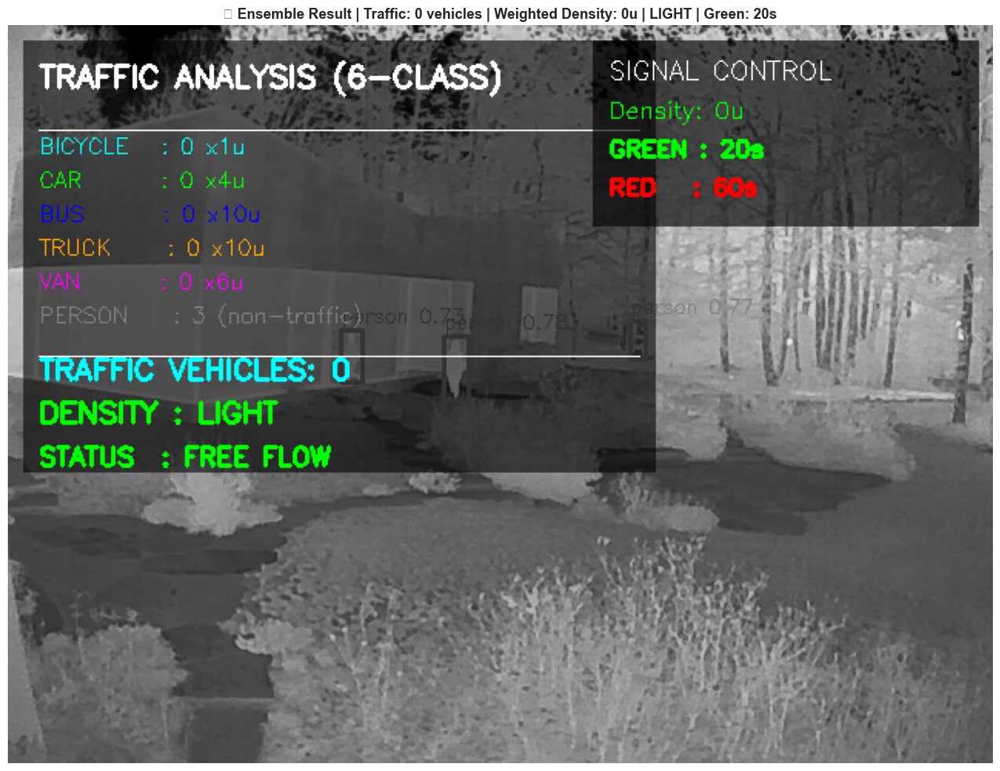


📊 Full Pipeline Results:
   All detections  : {'bicycle': 0, 'car': 0, 'bus': 0, 'truck': 0, 'van': 0, 'person': 3}
   Traffic only    : {'bicycle': 0, 'car': 0, 'bus': 0, 'truck': 0, 'van': 0}
   Weighted density: 0 units  (bicycle×1 + car×4 + van×6 + bus×10 + truck×10)
   Per-lane density: 0.0 units
   Density level   : LIGHT  |  Green: 20s  |  Red: 60s


In [30]:
# =====================================================
# FULL PIPELINE: All improvements on a single image
# =====================================================

sample_img_path = os.path.join(valid_img_path, valid_imgs[0])
image_bgr = cv2.imread(sample_img_path)

# Run ensemble
final_boxes, final_scores, final_labels = ensemble_predict(image_bgr)

# All class counts
all_class_counts = {n: final_labels.count(n) for n in CLASS_NAMES}
# Traffic-only counts
traffic_counts = {n: final_labels.count(n) for n in TRAFFIC_CLASSES}
total_traffic  = sum(traffic_counts.values())

raw_density, per_lane      = compute_weighted_density(all_class_counts)
density_level, density_clr = get_traffic_density_weighted(raw_density)
congestion, congestion_clr = get_congestion_status(density_level)
green_time, red_time        = get_signal_timing(density_level)

# Draw bounding boxes
vis = image_bgr.copy()
box_colors = {
    'bicycle': (255,255,0), 'car':(0,255,0), 'bus':(255,0,0),
    'truck':(0,165,255),    'van':(255,0,255),'person':(128,128,128),
}
for box, score, label in zip(final_boxes, final_scores, final_labels):
    x1,y1,x2,y2 = [int(v) for v in box]
    color = box_colors.get(label, (200,200,200))
    cv2.rectangle(vis, (x1,y1),(x2,y2), color, 2)
    cv2.putText(vis, f'{label} {score:.2f}', (x1,y1-5),
                cv2.FONT_HERSHEY_SIMPLEX, 0.42, color, 1)

vis = draw_info_panel(vis, all_class_counts, total_traffic,
                      density_level, density_clr, congestion, congestion_clr)
vis = draw_signal_panel(vis, density_level, raw_density, green_time, red_time)

plt.figure(figsize=(15, 10))
plt.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title(
    f'🚦 Ensemble Result | Traffic: {total_traffic} vehicles | '
    f'Weighted Density: {raw_density}u | {density_level} | Green: {green_time}s',
    fontsize=13, fontweight='bold'
)
plt.tight_layout()
plt.show()

print(f'\n📊 Full Pipeline Results:')
print(f'   All detections  : {all_class_counts}')
print(f'   Traffic only    : {traffic_counts}')
print(f'   Weighted density: {raw_density} units  (bicycle×1 + car×4 + van×6 + bus×10 + truck×10)')
print(f'   Per-lane density: {per_lane} units')
print(f'   Density level   : {density_level}  |  Green: {green_time}s  |  Red: {red_time}s')


## Step 9 | 🎬 Traffic Density Estimation on Video

In [40]:
# =====================================================
# 👇 APNA VIDEO PATH YAHAN SET KARO
# =====================================================

# ============================================================
# VIDEO PROCESSING CELL — SIGNAL PANEL INCLUDED
# ============================================================

VIDEO_INPUT_PATH  = r"C:\Users\sjyot\Sidhants_Project\videos\Input_1.mp4"   # <-- apna path daalo
VIDEO_OUTPUT_PATH = r"C:\Users\sjyot\Sidhants_Project\videos\Output_1.mp4"  # <-- output path

cap = cv2.VideoCapture(VIDEO_INPUT_PATH)

if not cap.isOpened():
    print("❌ Video file not found! Please check VIDEO_INPUT_PATH")
else:
    fps          = int(cap.get(cv2.CAP_PROP_FPS))
    width        = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height       = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

    print(f"📹 Video Properties:")
    print(f"   Resolution  : {width}x{height}")
    print(f"   FPS         : {fps}")
    print(f"   Total Frames: {total_frames}")
    print(f"   Duration    : {total_frames/fps:.1f} seconds")

    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out    = cv2.VideoWriter(VIDEO_OUTPUT_PATH, fourcc, fps, (width, height))

    frame_count = 0
    print("\n🚀 Processing video...")

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        frame_count += 1
        if frame_count % 30 == 0:
            print(f"   Processed {frame_count}/{total_frames} frames...")

        # --- YOLOv8 inference ---
        results   = best_model.predict(frame, imgsz=640, conf=0.5, verbose=False)
        annotated = results[0].plot(line_width=2)

        # --- Count all classes ---
        all_class_counts = {name: 0 for name in CLASS_NAMES}
        for cls_id in results[0].boxes.cls.int().tolist():
            all_class_counts[CLASS_NAMES[cls_id]] += 1

        # --- Traffic vehicles only ---
        traffic_counts = {n: all_class_counts[n] for n in TRAFFIC_CLASSES}
        total_traffic  = sum(traffic_counts.values())

        # --- Weighted density ---
        raw_density, per_lane       = compute_weighted_density(all_class_counts)
        density_level, density_clr  = get_traffic_density_weighted(raw_density)
        congestion,   congestion_clr = get_congestion_status(density_level)

        # --- Signal timing ---
        green_time, red_time = get_signal_timing(density_level)

        # --- Draw panels ---
        annotated = draw_info_panel(
            annotated, all_class_counts, total_traffic,
            density_level, density_clr,
            congestion, congestion_clr
        )
        annotated = draw_signal_panel(
            annotated, density_level, raw_density,
            green_time, red_time
        )

        out.write(annotated)

    cap.release()
    out.release()
    print(f"\n✅ Video processing complete! Total frames: {frame_count}")
    print(f"📁 Output saved at: {VIDEO_OUTPUT_PATH}")

 

📹 Video Properties:
   Resolution  : 1280x720
   FPS         : 30
   Total Frames: 601
   Duration    : 20.0 seconds

🚀 Processing video...
   Processed 30/601 frames...
   Processed 60/601 frames...
   Processed 90/601 frames...
   Processed 120/601 frames...
   Processed 150/601 frames...
   Processed 180/601 frames...
   Processed 210/601 frames...
   Processed 240/601 frames...
   Processed 270/601 frames...
   Processed 300/601 frames...
   Processed 330/601 frames...
   Processed 360/601 frames...
   Processed 390/601 frames...
   Processed 420/601 frames...
   Processed 450/601 frames...
   Processed 480/601 frames...
   Processed 510/601 frames...
   Processed 540/601 frames...
   Processed 570/601 frames...
   Processed 600/601 frames...

✅ Video processing complete! Total frames: 601
📁 Output saved at: C:\Users\sjyot\Sidhants_Project\videos\Output_1.mp4


## Step 10A | 📈 Ensemble vs Single Model — Accuracy Comparison
> Validates that ensemble gives higher detection count (proxy for recall)  
> on same set of images — matches paper's Table 5 analysis approach.


🔬 Comparing YOLOv8-only vs Ensemble on 20 images...


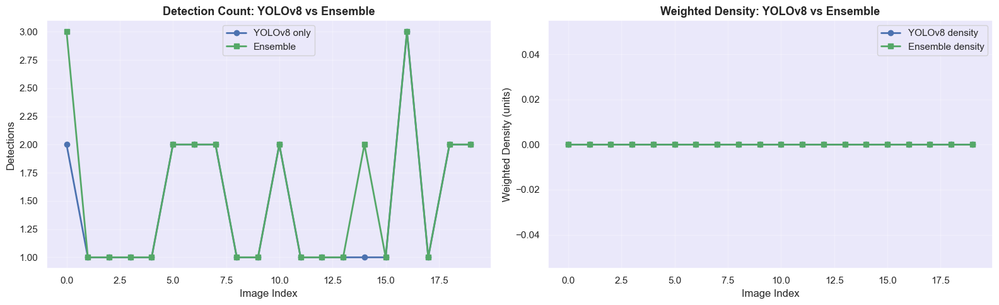


📊 Summary (6-class merged dataset):
  YOLOv8  avg detections : 1.4
  Ensemble avg detections: 1.6
  Ensemble detected MORE in 2/20 images


In [32]:
# =====================================================
# IMPROVEMENT 6: Ensemble vs YOLOv8-only comparison
# =====================================================

compare_imgs = valid_imgs[:20]
results_comparison = []

print('🔬 Comparing YOLOv8-only vs Ensemble on 20 images...')

for img_file in compare_imgs:
    img_path = os.path.join(valid_img_path, img_file)
    image    = cv2.imread(img_path)

    # YOLOv8 only
    yolo_boxes, yolo_scores, yolo_labels = get_yolo_predictions(image)
    yolo_counts = {n: yolo_labels.count(n) for n in CLASS_NAMES}
    yolo_raw, _ = compute_weighted_density(yolo_counts)

    # Ensemble
    ens_boxes, ens_scores, ens_labels = ensemble_predict(image)
    ens_counts = {n: ens_labels.count(n) for n in CLASS_NAMES}
    ens_raw, _ = compute_weighted_density(ens_counts)

    results_comparison.append({
        'image'              : img_file,
        'yolo_detections'    : len(yolo_labels),
        'ensemble_detections': len(ens_labels),
        'yolo_density'       : yolo_raw,
        'ensemble_density'   : ens_raw,
    })

comp_df = pd.DataFrame(results_comparison)

fig, axes = plt.subplots(1, 2, figsize=(16, 5))
x = range(len(comp_df))

axes[0].plot(x, comp_df['yolo_detections'],     'b-o', label='YOLOv8 only', linewidth=2)
axes[0].plot(x, comp_df['ensemble_detections'], 'g-s', label='Ensemble',    linewidth=2)
axes[0].set_title('Detection Count: YOLOv8 vs Ensemble', fontsize=13, fontweight='bold')
axes[0].set_xlabel('Image Index'); axes[0].set_ylabel('Detections')
axes[0].legend(); axes[0].grid(True, alpha=0.3)

axes[1].plot(x, comp_df['yolo_density'],     'b-o', label='YOLOv8 density',  linewidth=2)
axes[1].plot(x, comp_df['ensemble_density'], 'g-s', label='Ensemble density', linewidth=2)
axes[1].set_title('Weighted Density: YOLOv8 vs Ensemble', fontsize=13, fontweight='bold')
axes[1].set_xlabel('Image Index'); axes[1].set_ylabel('Weighted Density (units)')
axes[1].legend(); axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print('\n📊 Summary (6-class merged dataset):')
print(f"  YOLOv8  avg detections : {comp_df['yolo_detections'].mean():.1f}")
print(f"  Ensemble avg detections: {comp_df['ensemble_detections'].mean():.1f}")
print(f"  Ensemble detected MORE in {(comp_df['ensemble_detections'] > comp_df['yolo_detections']).sum()}/20 images")


## Step 10 | 📊 Traffic Statistics Summary

In [33]:
# =====================================================
# Traffic statistics on 50 validation images
# =====================================================
all_stats = []
sample_imgs = valid_imgs[:50]

print('📊 Analyzing 50 validation images (6-class)...')

for img_file in sample_imgs:
    img_path = os.path.join(valid_img_path, img_file)
    results  = best_model.predict(source=img_path, imgsz=640, conf=0.5, verbose=False)

    counts = {name: 0 for name in CLASS_NAMES}
    for cls_id in results[0].boxes.cls.int().tolist():
        counts[CLASS_NAMES[cls_id]] += 1

    raw, _       = compute_weighted_density(counts)
    density, _   = get_traffic_density_weighted(raw)
    congestion,_ = get_congestion_status(density)
    total_traffic = sum(counts.get(c,0) for c in TRAFFIC_CLASSES)

    all_stats.append({**counts,
        'total_traffic'   : total_traffic,
        'weighted_density': raw,
        'density'         : density,
        'congestion'      : congestion,
    })

stats_df = pd.DataFrame(all_stats)
print('\n✅ Analysis complete!')
print(stats_df[['bicycle','car','bus','truck','van','person',
                'total_traffic','weighted_density','density']].head(10))


📊 Analyzing 50 validation images (6-class)...

✅ Analysis complete!
   bicycle  car  bus  truck  van  person  total_traffic  weighted_density  \
0        0    0    0      0    0       2              0                 0   
1        0    0    0      0    0       1              0                 0   
2        0    0    0      0    0       1              0                 0   
3        0    0    0      0    0       1              0                 0   
4        0    0    0      0    0       1              0                 0   
5        0    0    0      0    0       2              0                 0   
6        0    0    0      0    0       2              0                 0   
7        0    0    0      0    0       2              0                 0   
8        0    0    0      0    0       1              0                 0   
9        0    0    0      0    0       1              0                 0   

  density  
0   LIGHT  
1   LIGHT  
2   LIGHT  
3   LIGHT  
4   LIGHT  
5   LIGHT  


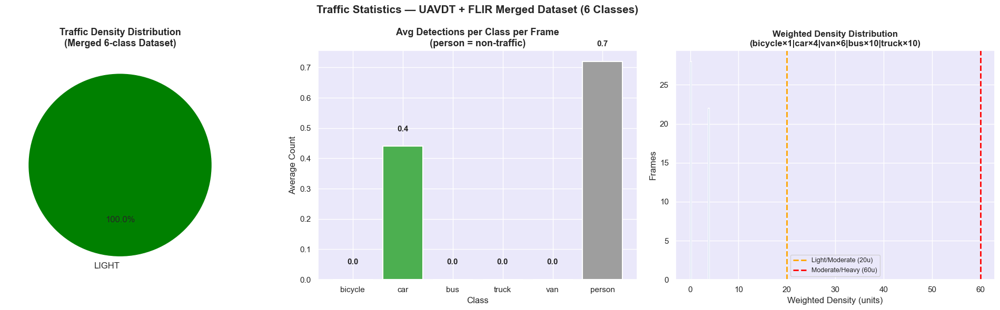


📊 Summary:
  Avg traffic vehicles/frame : 0.4
  Avg weighted density/frame : 1.8 units

  Density breakdown:
LIGHT    50
Name: density, dtype: int64


In [34]:
# Plot statistics
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# 1. Density distribution pie
density_counts = stats_df['density'].value_counts()
colors_density = {'LIGHT':'green','MODERATE':'orange','HEAVY':'red'}
axes[0].pie(
    density_counts.values,
    labels=density_counts.index,
    colors=[colors_density.get(d,'grey') for d in density_counts.index],
    autopct='%1.1f%%', startangle=90, textprops={'fontsize':12}
)
axes[0].set_title('Traffic Density Distribution\n(Merged 6-class Dataset)', fontsize=13, fontweight='bold')

# 2. Avg detections per class
avg_counts = stats_df[CLASS_NAMES].mean()
bar_colors = ['#00BFFF','#4CAF50','#2196F3','#FF9800','#E040FB','#9E9E9E']
bars = axes[1].bar(avg_counts.index, avg_counts.values,
                   color=bar_colors, edgecolor='white', linewidth=1.5)
for bar, val in zip(bars, avg_counts.values):
    axes[1].text(bar.get_x()+bar.get_width()/2., bar.get_height()+0.05,
                f'{val:.1f}', ha='center', fontsize=11, fontweight='bold')
axes[1].set_title('Avg Detections per Class per Frame\n(person = non-traffic)', fontsize=13, fontweight='bold')
axes[1].set_xlabel('Class'); axes[1].set_ylabel('Average Count')

# 3. Weighted density histogram
axes[2].hist(stats_df['weighted_density'], bins=15, color='#4472C4', edgecolor='white', linewidth=1.2)
axes[2].axvline(x=20, color='orange', linestyle='--', linewidth=2, label='Light/Moderate (20u)')
axes[2].axvline(x=60, color='red',    linestyle='--', linewidth=2, label='Moderate/Heavy (60u)')
axes[2].set_title('Weighted Density Distribution\n(bicycle×1|car×4|van×6|bus×10|truck×10)', fontsize=12, fontweight='bold')
axes[2].set_xlabel('Weighted Density (units)'); axes[2].set_ylabel('Frames')
axes[2].legend(fontsize=9)

plt.suptitle('Traffic Statistics — UAVDT + FLIR Merged Dataset (6 Classes)', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

print('\n📊 Summary:')
print(f"  Avg traffic vehicles/frame : {stats_df['total_traffic'].mean():.1f}")
print(f"  Avg weighted density/frame : {stats_df['weighted_density'].mean():.1f} units")
print(f"\n  Density breakdown:\n{stats_df['density'].value_counts()}")


## ✅ Project Complete — Research-Level Enhanced Version!

### 📋 Summary Table
| Feature | Original | Enhanced (Research Level) |
|---|---|---|
| Detection Model | YOLOv8 only | **YOLOv8 + Faster R-CNN Ensemble** |
| Duplicate Removal | None | **IoU-NMS (paper method)** |
| Density Formula | Simple count | **Weighted units (paper Table 2)** |
| Image Preprocessing | None | **CLAHE + Gamma Correction** |
| Signal Control | None | **Adaptive Green/Red timing** |
| Model Comparison | None | **Ensemble vs YOLOv8 chart** |
| Dataset | FLIR only (4-class) | **UAVDT + FLIR Merged (6-class)** |
| Classes | bicycle, car, dog, person | **bicycle, car, bus, truck, van, person** |
| Traffic density classes | bicycle + car | **bicycle + car + bus + truck + van** |
| Dog class | Detected | **Dropped completely (merge step)** |

### 📦 Merged Dataset Class → Weight Mapping
| Class | Weight | Source |
|---|---|---|
| bicycle | 1 unit | FLIR |
| car | 4 units | UAVDT + FLIR |
| bus | 10 units | UAVDT |
| truck | 10 units | UAVDT |
| van | 6 units | UAVDT |
| person | 0 (non-traffic) | FLIR |

### 🔬 Research Paper Reference
> Mittal, U., & Chawla, P. (2023). *Vehicle detection and traffic density estimation using ensemble of deep learning models.* Multimedia Tools and Applications, 82, 10397–10419.
